In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import cv2
from glob import glob
import random
from tensorflow.keras.preprocessing.image import load_img
# import cuda
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

In [2]:

import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
from tensorflow.keras.mixed_precision import set_global_policy

set_global_policy("mixed_float16")  # Enable mixed precision for faster computation


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 4050 Laptop GPU, compute capability 8.9


In [4]:
dataset_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/"

In [24]:
dataset_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/"

classes = sorted([cls for cls in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, cls))])

class_counts = {cls: len(os.listdir(os.path.join(dataset_path, cls))) for cls in classes}

df_class_distribution = pd.DataFrame(list(class_counts.items()), columns=["Class Name", "Image Count"])

df_class_distribution.insert(0, "S.No", range(1, len(df_class_distribution) + 1))

df_class_distribution = df_class_distribution.sort_values(by="Class Name").reset_index(drop=True)
df_class_distribution["S.No"] = df_class_distribution.index + 1  # Recalculate serial number after sorting

print(df_class_distribution.to_string(index=False))

 S.No       Class Name  Image Count
    1       all_benign         5000
    2        all_early         5000
    3          all_pre         5000
    4          all_pro         5000
    5     brain_glioma         5000
    6      brain_menin         5000
    7    brain_notumor         2000
    8      brain_tumor         5000
    9    breast_benign         5000
   10 breast_malignant         5000
   11       cervix_dyk         5000
   12       cervix_koc         5000
   13       cervix_mep         5000
   14       cervix_pab         5000
   15       cervix_sfi         5000
   16        colon_aca         5000
   17        colon_bnt         5000
   18    kidney_normal         5000
   19     kidney_tumor         5000
   20         lung_aca         5000
   21         lung_bnt         5000
   22         lung_scc         5000
   23        lymph_cll         5000
   24         lymph_fl         5000
   25        lymph_mcl         5000
   26      oral_normal         5001
   27         oral_scc      

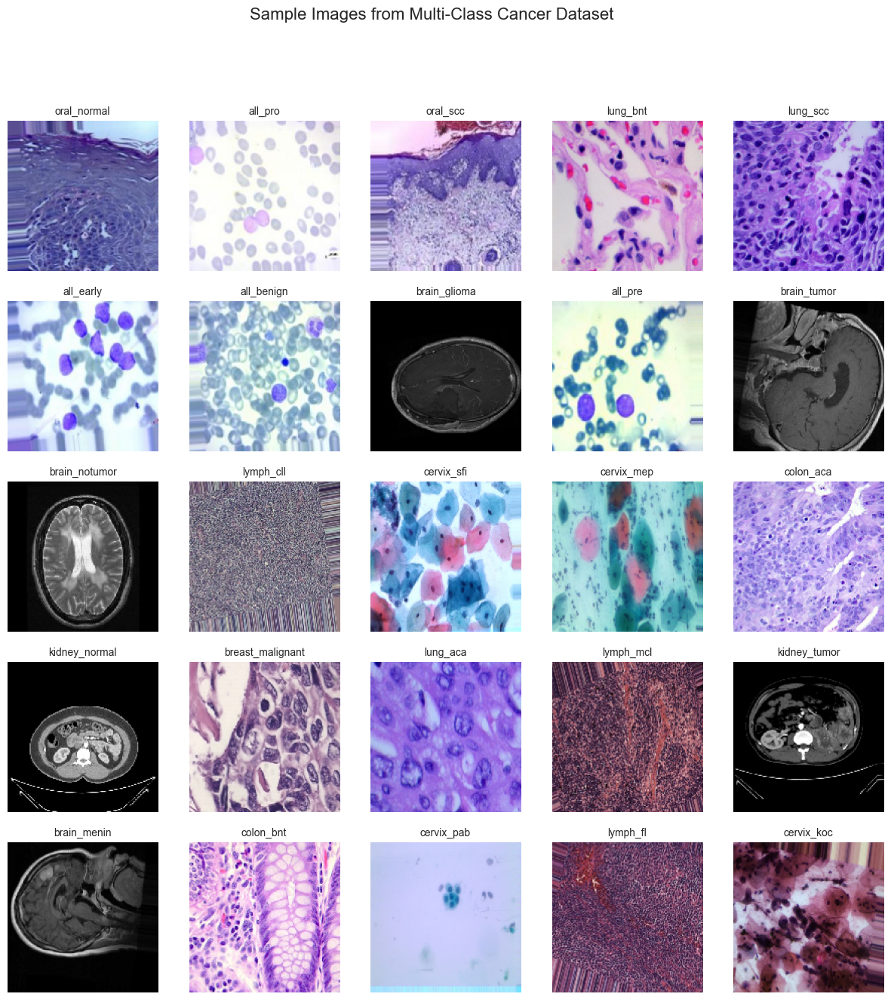

In [5]:

def plot_sample_images(dataset_path):
    fig, axes = plt.subplots(5, 5, figsize=(15, 15))  # 5 rows, 5 columns
    fig.suptitle("Sample Images from Multi-Class Cancer Dataset", fontsize=16)

    # Get 25 random classes from the 27 available
    cancer_classes = random.sample(os.listdir(dataset_path), 25)

    for ax, cancer_class in zip(axes.flat, cancer_classes):
        class_dir = os.path.join(dataset_path, cancer_class)

        if os.path.isdir(class_dir):
            img_file = random.choice(os.listdir(class_dir))  # Pick random image
            img_path = os.path.join(class_dir, img_file)

            img = load_img(img_path, target_size=(150, 150))  # Resize for display
            ax.imshow(img)
            ax.set_title(cancer_class, fontsize=10)
            ax.axis("off")

    plt.show()

# Call function
plot_sample_images(dataset_path)


C:\Users\saish\AppData\Local\Temp\ipykernel_9628\1110541816.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="coolwarm")


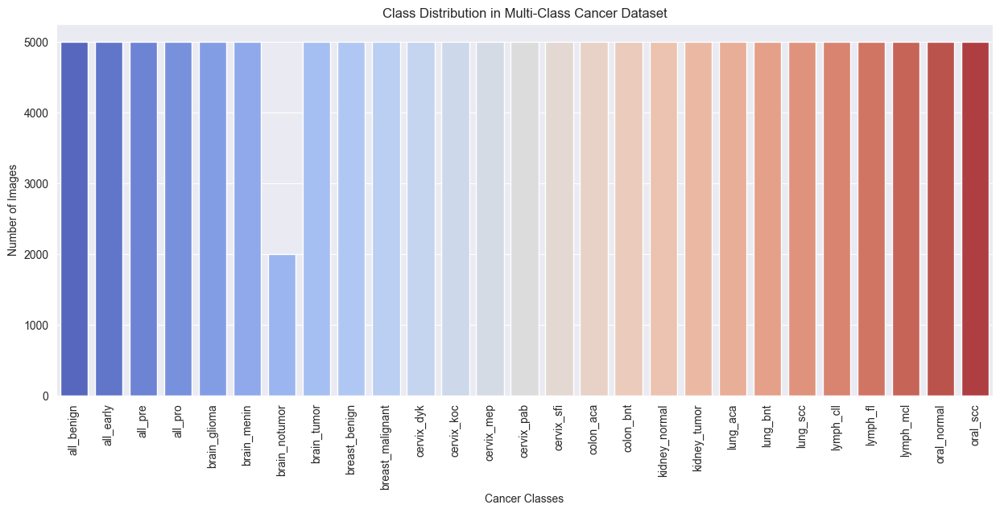

In [6]:
class_counts = {}

# Loop through each class folder (directly inside `Unified_Classes`)
for cancer_class in os.listdir(dataset_path):
    class_dir = os.path.join(dataset_path, cancer_class)
    if os.path.isdir(class_dir):  # Ensure it's a folder
        class_counts[cancer_class] = len(os.listdir(class_dir))  # Count images

# Sort by class name for better visualization
class_counts = dict(sorted(class_counts.items()))

# Plot the bar chart
plt.figure(figsize=(15, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="coolwarm")
plt.xticks(rotation=90)  # Rotate labels for readability
plt.xlabel("Cancer Classes")
plt.ylabel("Number of Images")
plt.title("Class Distribution in Multi-Class Cancer Dataset")
plt.show()

Found 132002 images belonging to 27 classes.


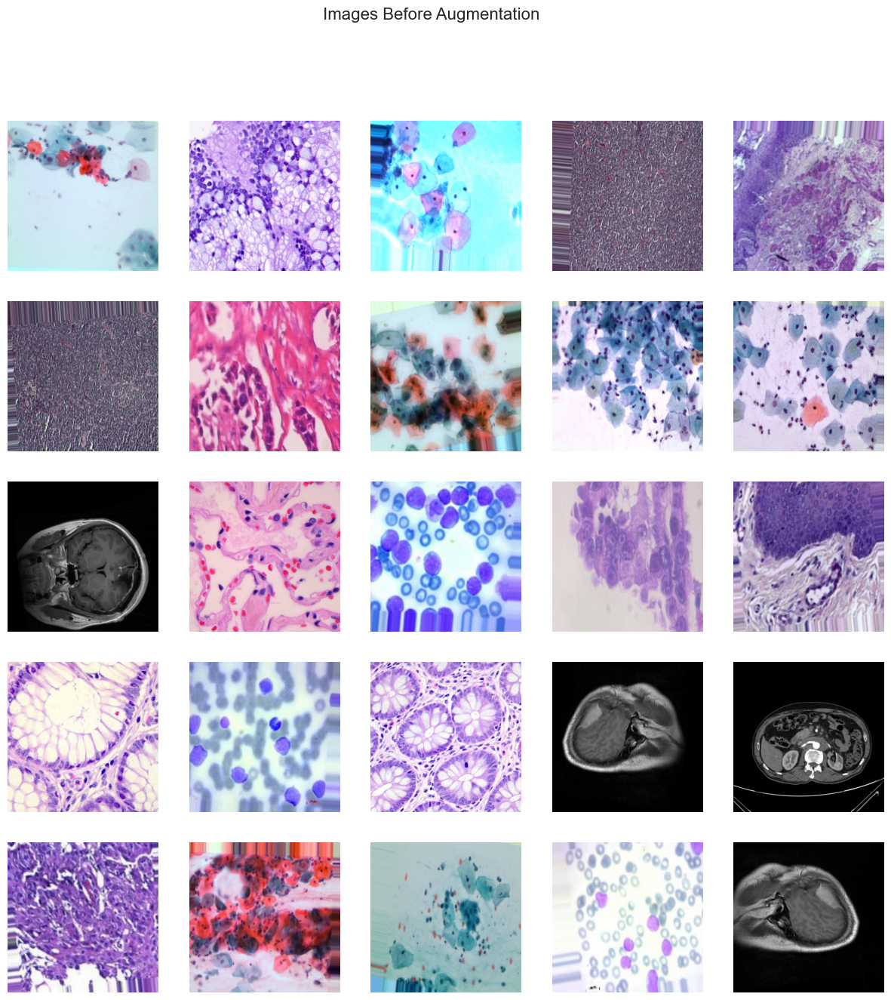

In [7]:

no_aug_datagen = ImageDataGenerator(rescale=1./255)

# Load images without augmentation
no_aug_generator = no_aug_datagen.flow_from_directory(
    dataset_path,
    target_size=(512, 512),  # 512x512
    batch_size=25,  # Fetch exactly 25 images
    class_mode="categorical"
)

def plot_images(generator, title):
    images, labels = next(generator)  # Get batch of images
    fig, axes = plt.subplots(5, 5, figsize=(15, 15))  # 5x5 grid
    fig.suptitle(title, fontsize=16)

    for i, ax in enumerate(axes.flat):  # Loop through 25 images
        ax.imshow(images[i])
        ax.axis("off")

    plt.show()

# Plot Before Augmentation
plot_images(no_aug_generator, "Images Before Augmentation")


In [8]:
IMG_SIZE = (224, 224)  #
BATCH_SIZE = 16

# Data augmentation & preprocessing for training + validation
train_datagen = ImageDataGenerator(
     rescale=1./255,                 # Normalize pixel values to [0, 1]
    rotation_range=10,             # Rotate max 10 degrees
    width_shift_range=0.1,         # Shift width by max 10%
    height_shift_range=0.1,        # Shift height by max 10%
    shear_range=0.05,              # Slight shearing
    zoom_range=0.1,                # Max 10% zoom in/out
    horizontal_flip=True,          # Still useful for symmetry-based tasks
    brightness_range=[0.8, 1.2],   # Controlled brightness adjustment
    fill_mode="nearest",   # Fill missing pixels after transformation
    validation_split=0.2  # Split data (80% Train, 20% Validation)
)

# Preprocessing (only rescaling) for test set
test_datagen = ImageDataGenerator(
    rescale=1./255,
validation_split=0.1
)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 validation_split=0.2)


In [9]:
# Load Training Data (80%)
train_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,  # 512x512 images
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="training"
)

# Load Validation Data (20%)
val_generator = val_datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,  # 512x512 images
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="validation"
)

# Load Test Data (Full Dataset)
test_generator = test_datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,  # 512x512 images
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="validation",
    shuffle=False  # No shuffling to maintain order for evaluation
)


Found 105602 images belonging to 27 classes.
Found 26400 images belonging to 27 classes.
Found 13200 images belonging to 27 classes.


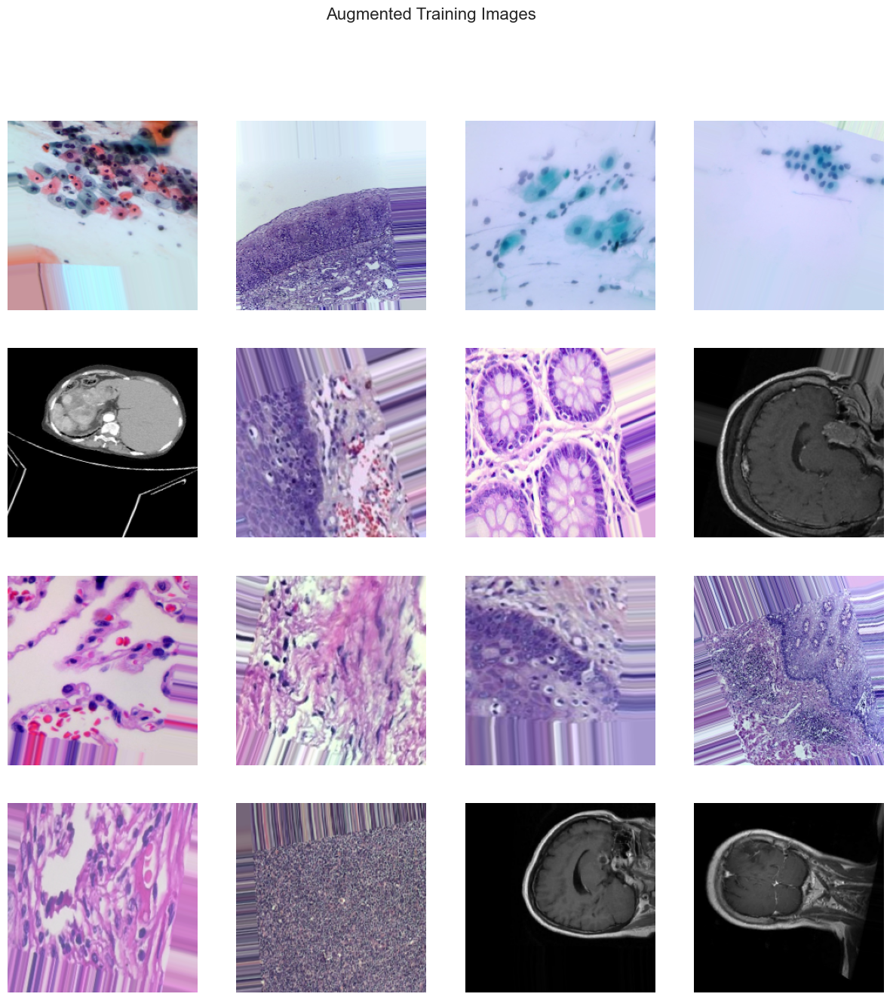

In [10]:
def plot_augmented_images(generator, title):
    images, labels = next(generator)  # Get a batch of images
    fig, axes = plt.subplots(4, 4, figsize=(15, 15))
    fig.suptitle(title, fontsize=16)

    for i, ax in enumerate(axes.flat):  # Loop through 25 images
        ax.imshow(images[i])
        ax.axis("off")

    plt.show()

# Plot samples
plot_augmented_images(train_generator, "Augmented Training Images")



In [11]:
import os


# Number of classes (Count only folders inside `Unified_Classes`)
num_classes = len([cancer_type for cancer_type in os.listdir(dataset_path)
                   if os.path.isdir(os.path.join(dataset_path, cancer_type))])

print("Total number of classes:", num_classes)


Total number of classes: 27


In [12]:
# Reduce filters to 16, 32, 64, 128
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape= (224, 224, 3)),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation='relu', padding='same'),
    MaxPooling2D((2, 2)),

     Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.4),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(num_classes, activation='softmax')  # Output layer
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Multi-class classification
              metrics=['accuracy'])


In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 128)      0

In [14]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

model_checkpoint = ModelCheckpoint("cnn_model.keras", monitor='val_loss', save_best_only=True, verbose=1)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6)

# Store Callbacks in List
callbacks = [early_stopping, model_checkpoint, reduce_lr]

In [15]:
history = model.fit(train_generator,
                    validation_data=val_generator,
                    epochs=50,
                    callbacks=callbacks)


Epoch 1/50
6601/6601 [==============================] - ETA: 0s - loss: 0.9326 - accuracy: 0.6359
Epoch 1: val_loss improved from inf to 0.56587, saving model to cnn_model.keras
6601/6601 [==============================] - 1866s 282ms/step - loss: 0.9326 - accuracy: 0.6359 - val_loss: 0.5659 - val_accuracy: 0.7795 - lr: 0.0010
Epoch 2/50
6601/6601 [==============================] - ETA: 0s - loss: 0.5379 - accuracy: 0.7893
Epoch 2: val_loss improved from 0.56587 to 0.43269, saving model to cnn_model.keras
6601/6601 [==============================] - 1784s 270ms/step - loss: 0.5379 - accuracy: 0.7893 - val_loss: 0.4327 - val_accuracy: 0.8282 - lr: 0.0010
Epoch 3/50
6601/6601 [==============================] - ETA: 0s - loss: 0.4536 - accuracy: 0.8256
Epoch 3: val_loss did not improve from 0.43269
6601/6601 [==============================] - 1788s 271ms/step - loss: 0.4536 - accuracy: 0.8256 - val_loss: 0.4963 - val_accuracy: 0.8275 - lr: 0.0010
Epoch 4/50
6601/6601 [====================

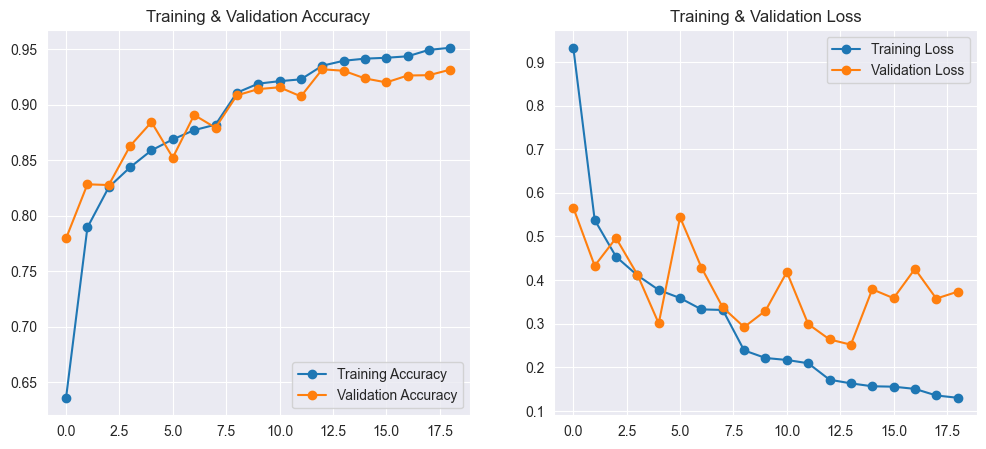

In [16]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))

# Plot Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label="Training Accuracy", marker='o')
plt.plot(epochs_range, val_acc, label="Validation Accuracy", marker='o')
plt.legend(loc="lower right")
plt.title("Training & Validation Accuracy")

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label="Training Loss", marker='o')
plt.plot(epochs_range, val_loss, label="Validation Loss", marker='o')
plt.legend(loc="upper right")
plt.title("Training & Validation Loss")

plt.show()


In [17]:
test_loss, test_acc = model.evaluate(test_generator, verbose=1)
print(f"Test Accuracy: {test_acc * 100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

825/825 [==============================] - 29s 35ms/step - loss: 0.2695 - accuracy: 0.9292
Test Accuracy: 92.92%
Test Loss: 0.2695


In [34]:
from sklearn.metrics import classification_report

Y_pred = model.predict(test_generator)
y_pred = np.argmax(Y_pred, axis=1)
y_true = test_generator.classes

print(classification_report(y_true, y_pred, target_names=test_generator.class_indices.keys()))

825/825 [==============================] - 39s 47ms/step
                  precision    recall  f1-score   support

      all_benign       1.00      0.99      0.99       500
       all_early       1.00      0.99      0.99       500
         all_pre       0.98      1.00      0.99       500
         all_pro       1.00      1.00      1.00       500
    brain_glioma       0.92      0.96      0.94       500
     brain_menin       0.93      0.77      0.84       500
   brain_notumor       0.98      0.97      0.98       200
     brain_tumor       0.86      0.97      0.91       500
   breast_benign       0.88      0.97      0.92       500
breast_malignant       0.97      0.85      0.91       500
      cervix_dyk       0.99      1.00      0.99       500
      cervix_koc       1.00      0.95      0.97       500
      cervix_mep       0.99      0.98      0.99       500
      cervix_pab       1.00      1.00      1.00       500
      cervix_sfi       0.96      1.00      0.98       500
       colon_a

825/825 [==============================] - 93s 112ms/step


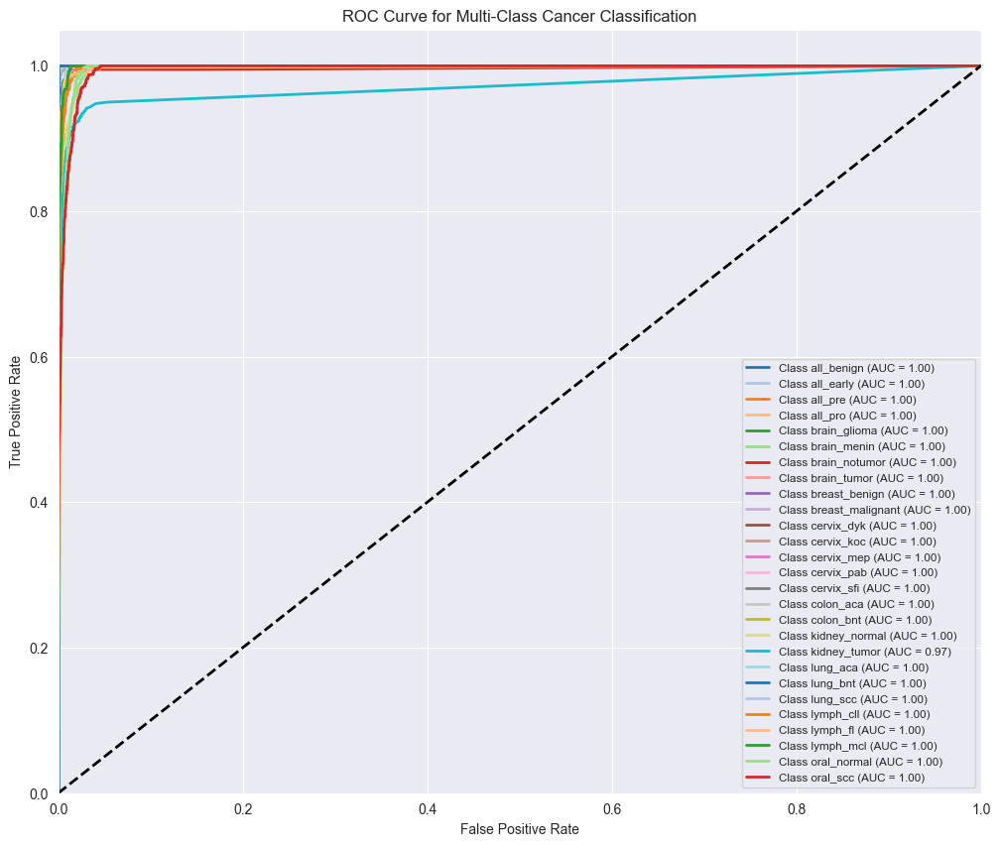

In [32]:
y_true = test_generator.classes
y_pred_proba = model.predict(test_generator)

# Binarize the labels for multi-class ROC
y_true_bin = label_binarize(y_true, classes=range(num_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_pred_proba.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

plt.figure(figsize=(12, 10))

colors = cycle(plt.cm.tab20.colors)  # Use 20 distinct colors
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {classes[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], "k--", lw=2)  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Multi-Class Cancer Classification")
plt.legend(loc="lower right", fontsize='small')
plt.grid(True)
plt.show()

1/1 [==============================] - 1s 575ms/step


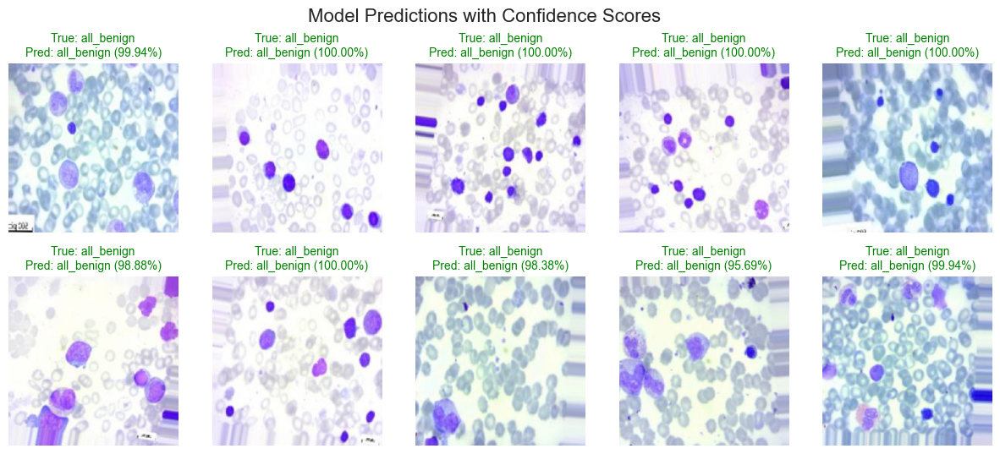

In [19]:

images, true_labels = next(test_generator)  # Fetch one batch
predictions = model.predict(images)  # Predict on batch
predicted_classes = np.argmax(predictions, axis=1)  # Get predicted class index
confidence_scores = np.max(predictions, axis=1) * 100  # Get confidence percentage

class_indices = test_generator.class_indices
class_labels = {v: k for k, v in class_indices.items()}  # Reverse mapping

num_images = 10  # Adjust this as needed
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 2 rows, 5 columns
fig.suptitle("Model Predictions with Confidence Scores", fontsize=16)

for i, ax in enumerate(axes.flat[:num_images]):  # Loop through images
    ax.imshow(images[i])  # Show image
    true_class = class_labels[true_labels[i].argmax()]  # Get true class
    pred_class = class_labels[predicted_classes[i]]  # Get predicted class
    confidence = confidence_scores[i]  # Get confidence percentage

    # Set title with True label, Predicted label, and Confidence score
    title_color = "green" if true_class == pred_class else "red"
    ax.set_title(f"True: {true_class}\nPred: {pred_class} ({confidence:.2f}%)", fontsize=10, color=title_color)
    ax.axis("off")

plt.show()


825/825 [==============================] - 30s 37ms/step


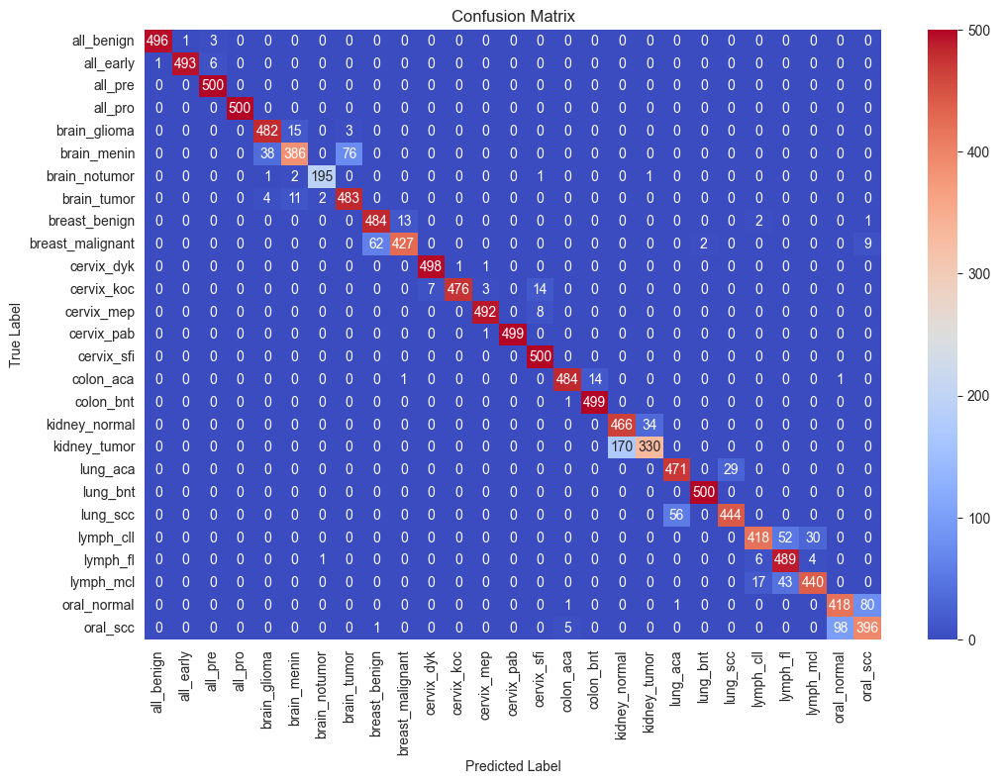

In [20]:
from sklearn.metrics import confusion_matrix

# Get true labels from test generator
true_classes = test_generator.classes  # True class labels

# Get class labels mapping
class_indices = test_generator.class_indices
class_labels = {v: k for k, v in class_indices.items()}  # Reverse mapping

# Predict on test data
predictions = model.predict(test_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)  # Convert probabilities to class labels

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="coolwarm", xticklabels=class_labels.values(), yticklabels=class_labels.values())
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 492ms/step


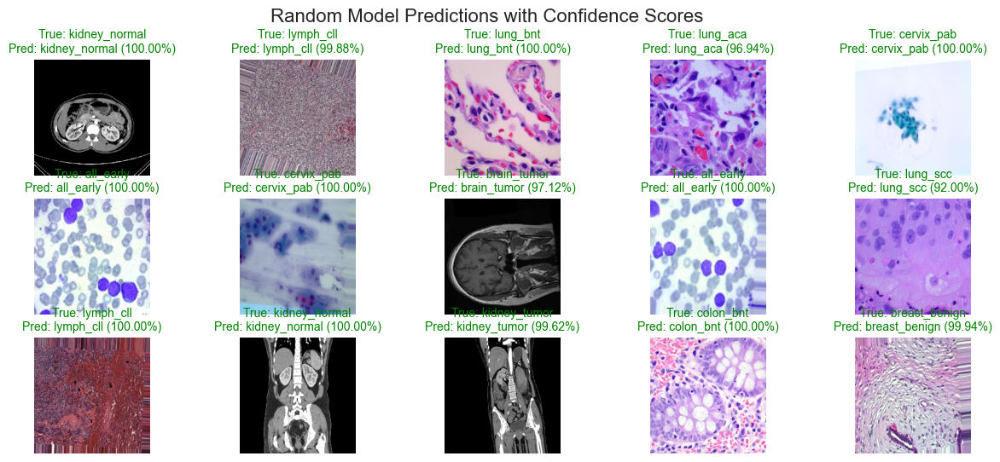

In [22]:
num_test_images = test_generator.samples
batch_size = test_generator.batch_size

test_generator.reset()
all_images, all_labels = [], []

for _ in range(int(np.ceil(num_test_images / batch_size))):  # Iterate over batches
    batch_images, batch_labels = next(test_generator)
    all_images.extend(batch_images)
    all_labels.extend(batch_labels)

all_images = np.array(all_images)
all_labels = np.array(all_labels)

num_images = 15  # Number of images to display
random_indices = random.sample(range(num_test_images), num_images)
selected_images = all_images[random_indices]
selected_labels = all_labels[random_indices]

predictions = model.predict(selected_images)
predicted_classes = np.argmax(predictions, axis=1)
confidence_scores = np.max(predictions, axis=1) * 100  # Confidence in percentage

class_indices = test_generator.class_indices
class_labels = {v: k for k, v in class_indices.items()}

fig, axes = plt.subplots(3, 5, figsize=(15, 6))  # 2 rows, 5 columns
fig.suptitle("Random Model Predictions with Confidence Scores", fontsize=16)

for i, ax in enumerate(axes.flat):  # Loop through 10 images
    ax.imshow(selected_images[i])  # Display image
    true_class = class_labels[selected_labels[i].argmax()]  # True label
    pred_class = class_labels[predicted_classes[i]]  # Predicted label
    confidence = confidence_scores[i]  # Confidence percentage

    title_color = "green" if true_class == pred_class else "red"
    ax.set_title(f"True: {true_class}\nPred: {pred_class} ({confidence:.2f}%)",
                 fontsize=10, color=title_color)
    ax.axis("off")

plt.show()


## Backend Testing

In [27]:
from tensorflow.keras.preprocessing import image

def predict_image(model, img_path, class_names, image_size=(224, 224)):
    # Load and preprocess image
    img = image.load_img(img_path, target_size=image_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Predict
    predictions = model.predict(img_array)[0]
    predicted_index = np.argmax(predictions)
    predicted_class = class_names[predicted_index]
    confidence = predictions[predicted_index]

    # --- Visualization ---
    plt.figure(figsize=(12, 10))

    # Show image
    plt.subplot(2, 1, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {predicted_class} ({confidence * 100:.2f}%)", fontsize=14, color='green')

    # Horizontal bar chart for confidence
    plt.subplot(2, 1, 2)
    bars = plt.barh(class_names, predictions, color='skyblue')
    bars[predicted_index].set_color('green')  # highlight predicted class
    plt.xlabel("Confidence Score")
    plt.xlim(0, 1)
    plt.tight_layout()
    plt.show()

    print(f"Predicted Label: {predicted_class}")
    print(f"Confidence: {confidence:.4f}")

1/1 [==============================] - 0s 190ms/step


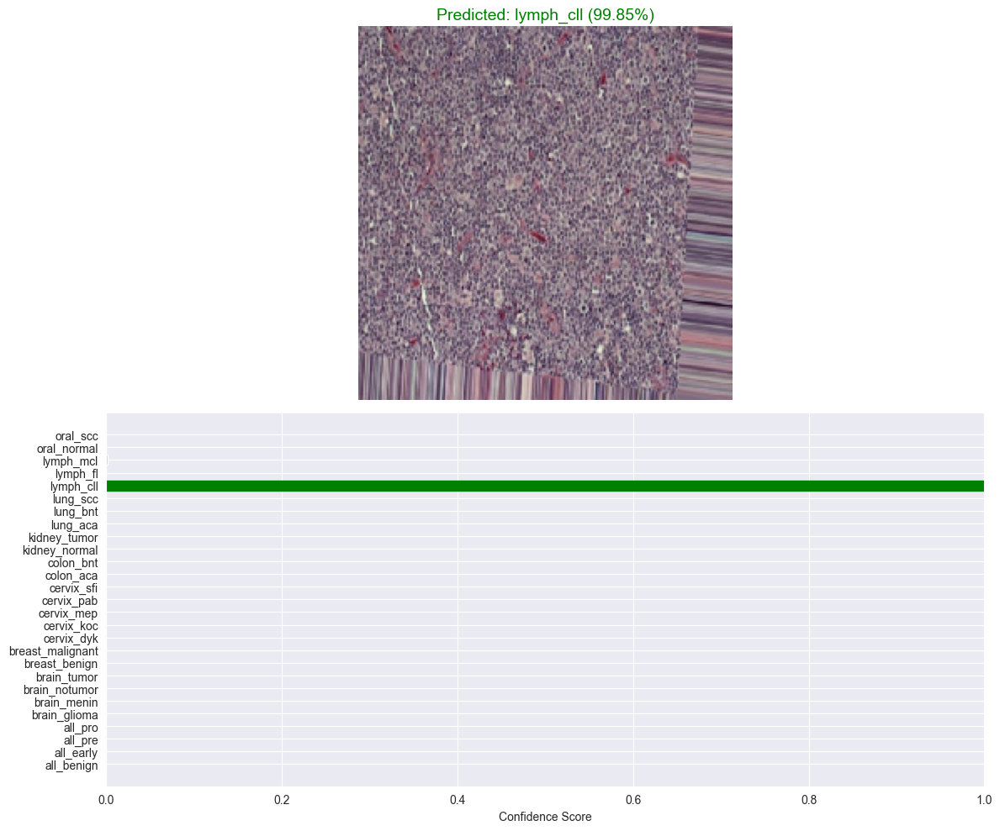

Predicted Label: lymph_cll
Confidence: 0.9985


In [28]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/lymph_cll/lymph_cll_0015.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 0s 73ms/step


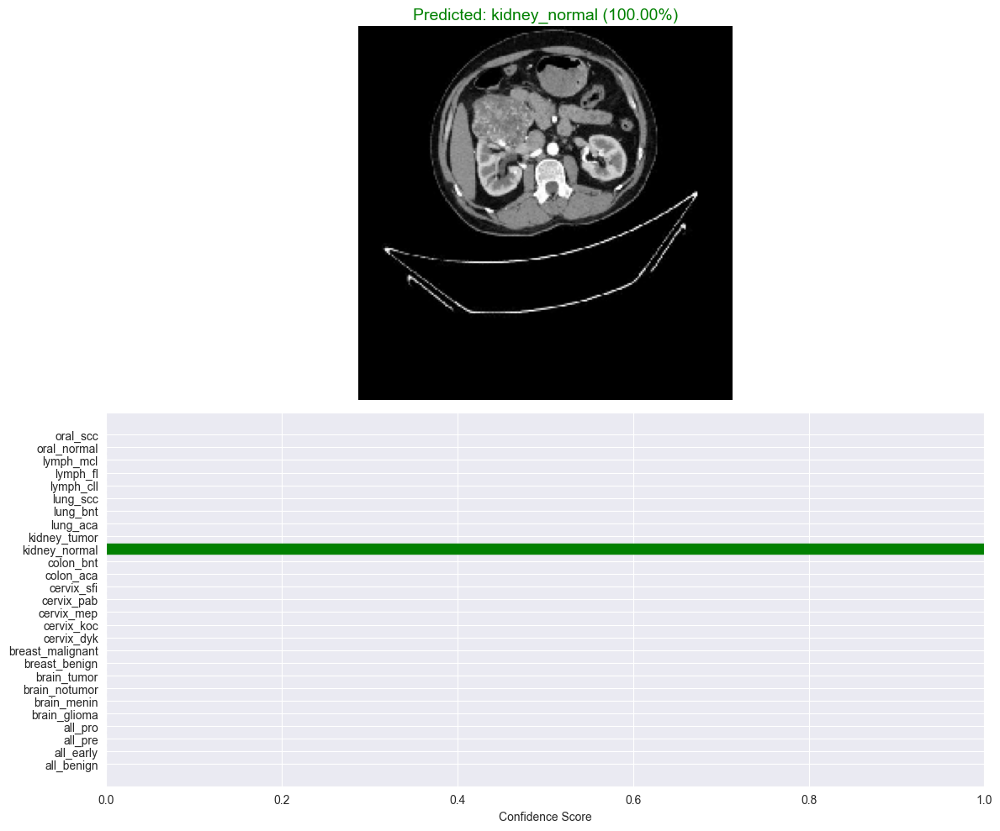

Predicted Label: kidney_normal
Confidence: 1.0000


In [29]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/kidney_tumor/kidney_tumor_0015.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 0s 74ms/step


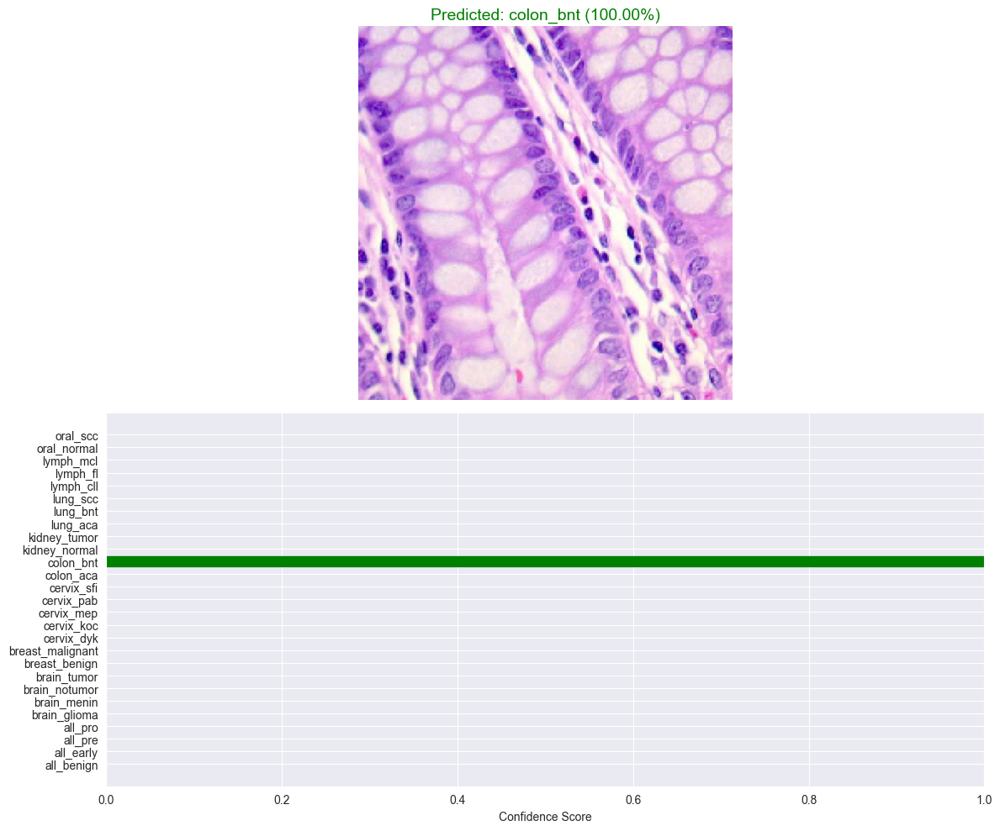

Predicted Label: colon_bnt
Confidence: 1.0000


In [30]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/colon_bnt/colon_bnt_0006.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 0s 77ms/step


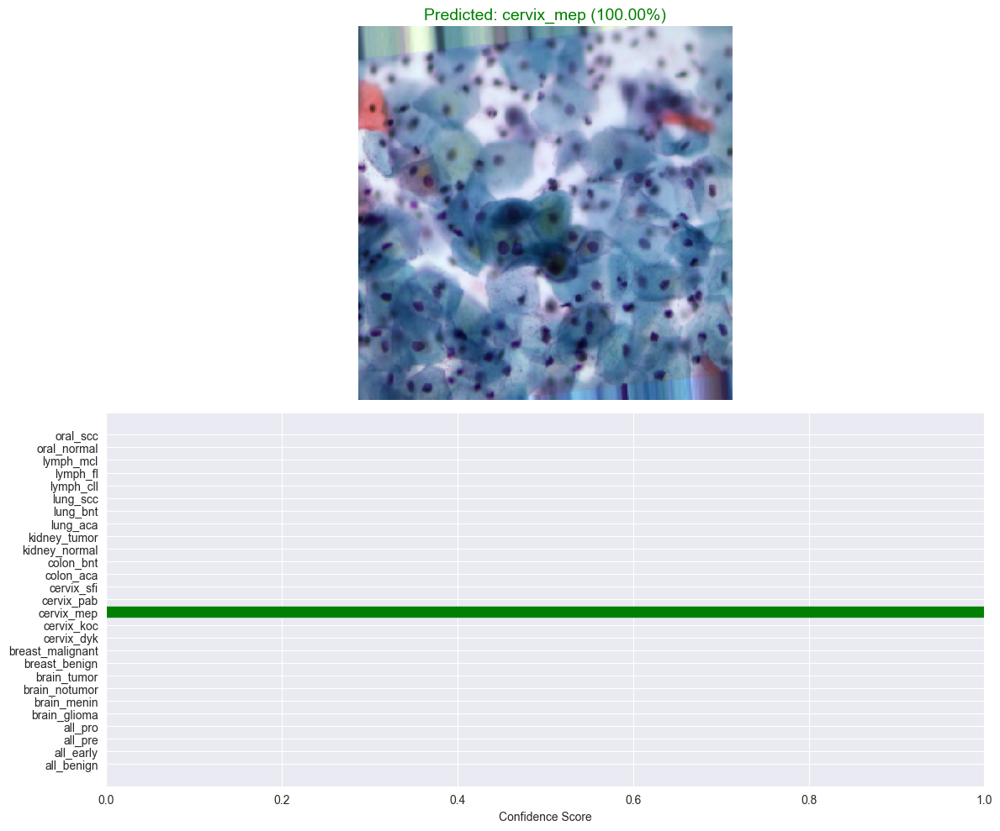

Predicted Label: cervix_mep
Confidence: 1.0000


In [31]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/cervix_mep/cervix_mep_0007.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.preprocessing import image
import tensorflow as tf
import cv2

Model loaded successfully!
1/1 [==============================] - 0s 76ms/step


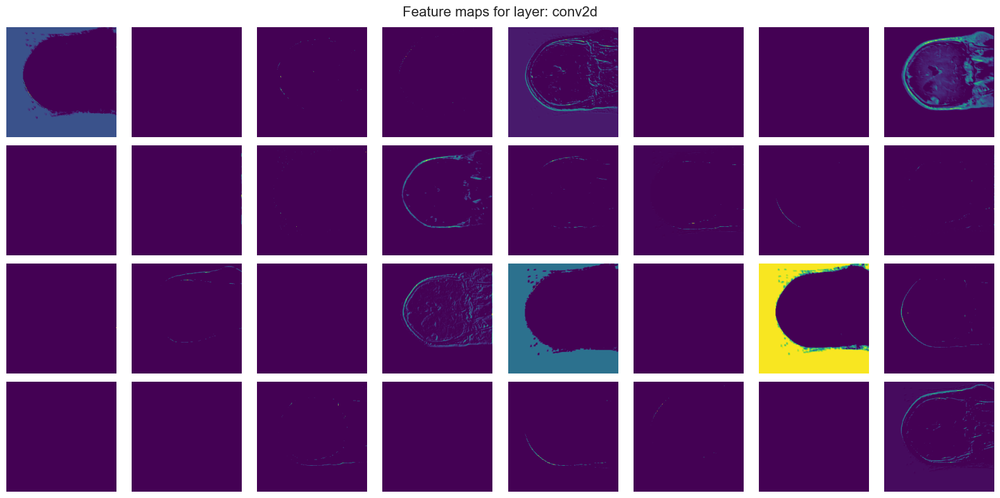

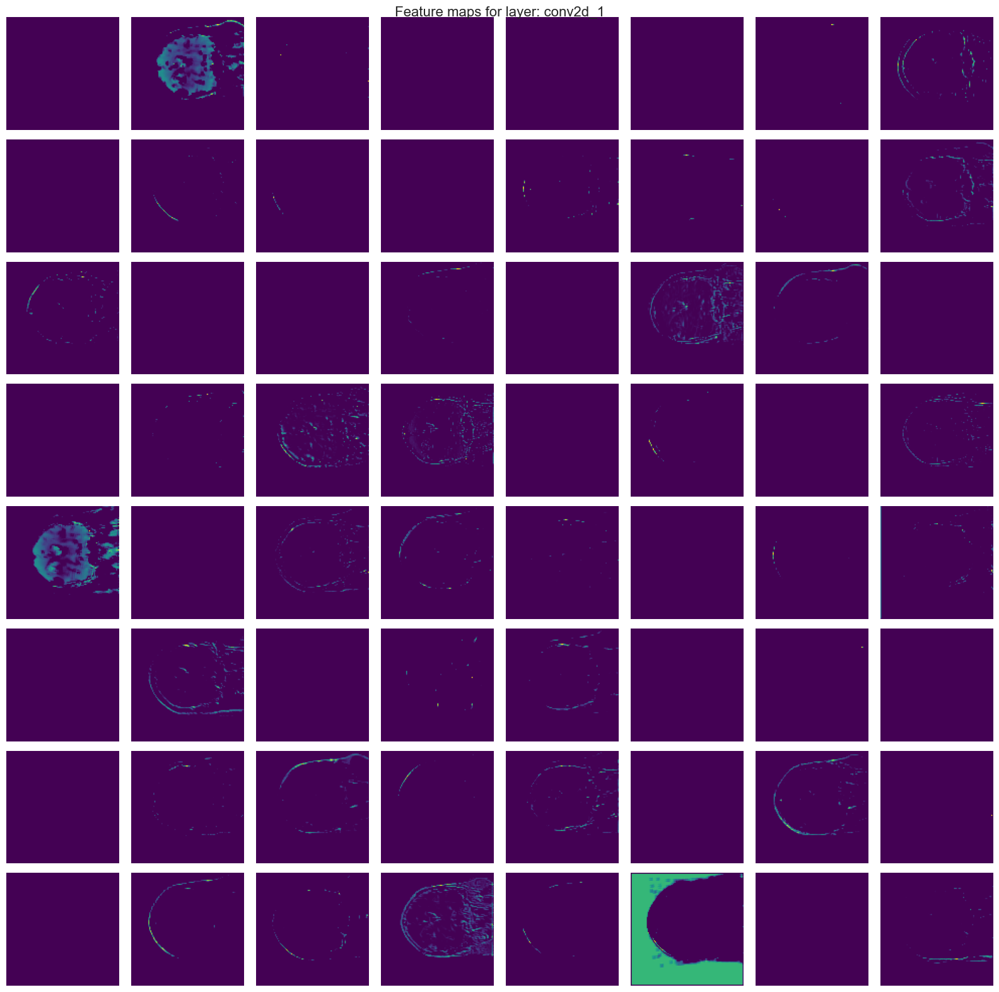

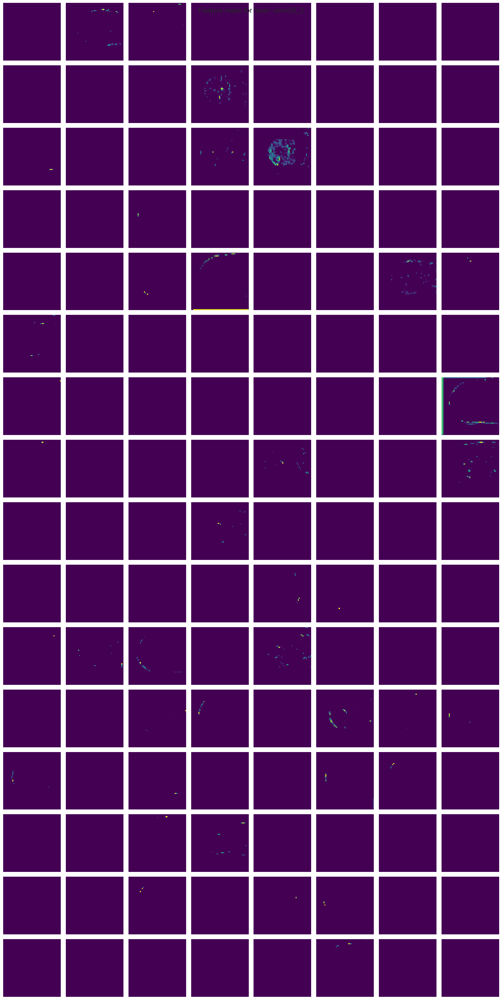

In [8]:
model_path = "cnn_model.keras"

model = load_model(model_path)
print("Model loaded successfully!")

img_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/brain_glioma/brain_glioma_0004.jpg"

img = image.load_img(img_path, target_size=(224, 224))  # Resize to model input size
img_array = image.img_to_array(img) / 255.0            # Normalize to [0,1]
img_array = np.expand_dims(img_array, axis=0)          # Add batch dimension

layer_outputs = []
layer_names = []

for layer in model.layers:
    if 'conv' in layer.name:
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)

activation_model = Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_array)

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # Number of filters in this layer
    size = layer_activation.shape[1]         # Feature map size (height and width)

    n_cols = min(8, n_features)
    n_rows = (n_features + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2))
    fig.suptitle(f'Feature maps for layer: {layer_name}', fontsize=16)

    for i in range(n_rows * n_cols):
        if i < n_features:
            ax = axes.flat[i]
            feature_map = layer_activation[0, :, :, i]
            ax.imshow(feature_map, cmap='viridis')
            ax.axis('off')
        else:
            axes.flat[i].axis('off')

    plt.tight_layout()
    plt.show()

# END